In [1]:
from database.strategy import Strategy
from database.sec import SEC
from database.market import Market
from database.weather import Weather
from transformer.date_transformer import DateTransformer
from transformer.column_transformer import ColumnTransformer
from transformer.model_transformer import ModelTransformer
from transformer.product_transformer import ProductTransformer
from transformer.predictor_transformer import PredictorTransformer
from preprocessor.model_preprocessor import ModelPreprocessor
from preprocessor.predictor_preprocessor import PredictorPreprocessor
from modeler.modeler import Modeler as sp
from utils.date_utils import DateUtils
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta, timezone
from tqdm import tqdm
import math
import findspark
findspark.init()
from pyspark import SparkContext
from pyspark.sql import SparkSession

In [2]:
## Loading Constants
start = "2008-01-01"
end = datetime(2021,1,7).strftime("%Y-%m-%d")
# Loading Databases
strat_db = Strategy("unity")
market = Market()
dataset = "pdr"
## Acquiring Datasets
market.connect()
tickers = market.retrieve_data("sp500")
prices = market.retrieve_data("pdr_prices")
if dataset == "pdr":
    prices = ColumnTransformer.rename_columns(prices," ")
else:
    prices = ColumnTransformer.rename_columns(prices,"")
prices = DateTransformer.convert_to_date(dataset,prices,"date")
correlations = market.retrieve_data("coint")
correlations["same"] = [abs(x) for x in correlations["corr"]]
correlations = correlations[correlations["same"] >= 0.8]
classification = market.retrieve_data("dataset_{}_week_classification".format(dataset))
regression = market.retrieve_data("dataset_{}_week_regression".format(dataset))
for col in regression.columns:
    if -99999 == regression[col].min():
        regression.drop(col,axis=1,inplace=True)
for col in classification.columns:
    if -99999 == classification[col].min():
        classification.drop(col,axis=1,inplace=True)
market.close()
reload = True

In [3]:
gap = 5
week_gap = int(gap/5)
training_years = 1

In [4]:
## setting up groups
tickers["group"] = [x % 4 for x in list(tickers.index)]

In [5]:
sc = SparkContext("local[4]","first app")

In [6]:
spark = SparkSession(sc)

In [7]:
tickers_df = spark.createDataFrame(tickers[["Symbol","group"]])

In [8]:
group_parallel = sc.parallelize(tickers["group"].unique())
tickers_parallel = sc.broadcast(tickers_df.collect())

In [15]:
quarterly_range = range(1,5)
yearly_range = range(2017,2021)
training_range = range(3,9,2)
def model(group):
    results = []
    all_tickers = pd.DataFrame(tickers_parallel.value,columns=["ticker","group"])
    all_correlations = correlations.copy()
    all_regression = regression.copy()
    all_classification = classification.copy()
    group_tickers = all_tickers[all_tickers["group"]== group]
    model_range = range(len(group_tickers))
    for i in tqdm(model_range):
        try:
            ticker = group_tickers.iloc[i]["ticker"].replace(".","-")
            tc = all_correlations[(all_correlations["t1"]==ticker) | (all_correlations["t2"]==ticker)]
            relevant_tickers = tc["t1"].unique().tolist()
            relevant_tickers.extend(tc["t2"].unique().tolist())
            rt = list(set(relevant_tickers))
            mr = ModelPreprocessor(ticker)
            prot = ProductTransformer(ticker,start,end)
            regression_tickers = []
            for relevant_ticker in rt:
                if relevant_ticker in regression.columns:
                    regression_tickers.append(relevant_ticker)
            regression_tickers.extend(["year","quarter","week"])
            ticker_regression = all_regression[regression_tickers]
            ticker_regression["y"] = ticker_regression[ticker]
            ticker_regression["y"] = ticker_regression["y"].shift(-week_gap)
            ticker_regression = ticker_regression[:-week_gap]
            classification_tickers = []
            for relevant_ticker in rt:
                if relevant_ticker in classification.columns:
                    classification_tickers.append(relevant_ticker)
            classification_tickers.extend(["year","quarter","week"])
            ticker_classification = all_classification[classification_tickers]
            ticker_classification["y"] = ticker_classification[ticker]
            ticker_classification["y"] = ticker_classification["y"].shift(-week_gap)
            ticker_classification = ticker_classification[:-week_gap]
        except Exception as e:
            print(ticker,str(e))
            continue
        for training_years in training_range: 
            for year in yearly_range:
                for quarter in quarterly_range:
                    try:
                        ## regression_model
                        first = ticker_regression[(ticker_regression["year"] == year - training_years) & (ticker_regression["quarter"] == quarter)].index.values.tolist()[0]
                        last = ticker_regression[(ticker_regression["year"] == year) & (ticker_regression["quarter"] == quarter)].index.values.tolist()[0]
                        rqpd = ticker_regression.iloc[first:last-1]
                        qpd = mr.day_trade_preprocess_regression(rqpd.copy(),ticker,True)
                        rpr = sp.regression(qpd,ranked=False,tf=False,deep=False)
                        ## classification_model
                        first = ticker_classification[(ticker_classification["year"] == year - training_years) & (ticker_classification["quarter"] == quarter)].index.values.tolist()[0]
                        last = ticker_classification[(ticker_classification["year"] == year) & (ticker_classification["quarter"] == quarter)].index.values.tolist()[0]
                        cqpd = ticker_classification.iloc[first:last-1]
                        qpd = mr.day_trade_preprocess_classify(cqpd.copy(),ticker)
                        cpr = sp.classification(qpd,tf=False,deep=False)
                        price_results = pd.DataFrame([cpr,rpr])
                        product_qpds = []
                        for j in range(len(price_results)):
                            price_result = price_results.iloc[j]
                            if price_result["model_type"] == "regression":
                                weekly_price_data = ticker_regression
                                weekly_price_data = weekly_price_data[(weekly_price_data["year"] == year) & (weekly_price_data["quarter"] == quarter)]
                                product_qpd = mr.day_trade_preprocess_regression(weekly_price_data.copy(),ticker,False)
                            else:
                                weekly_price_data = ticker_classification
                                weekly_price_data = weekly_price_data[(weekly_price_data["year"] == year) & (weekly_price_data["quarter"] == quarter)]
                                product_qpd = mr.day_trade_preprocess_classify(weekly_price_data.copy(),ticker)
                            product_qpds.append(product_qpd)
                        sim = prot.merge_weeklies_v2(product_qpds,price_results,year,quarter,"price")
                        sim["training_years"] = training_years
                        results.append(sim)
                    except Exception as e:
                        print(ticker,str(e))
                        continue
    return pd.concat(results)

In [16]:
sim = group_parallel.map(lambda x: model(x)).collect()

In [26]:
product = pd.concat(sim)
# product = product.merge(regression,on=["year","quarter","week"],how="left")

In [28]:
strat_db.connect()
strat_db.store_data("parallel_weekly_sim",product)
strat_db.close()

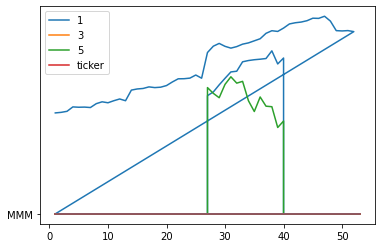

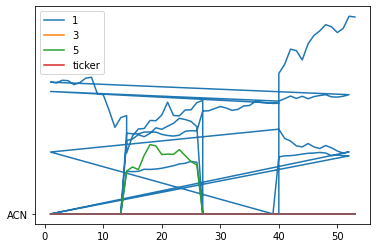

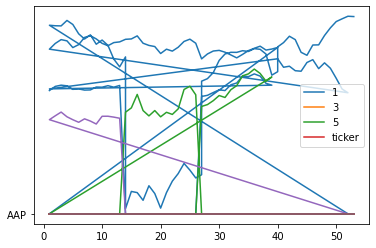

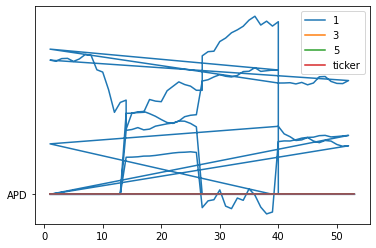

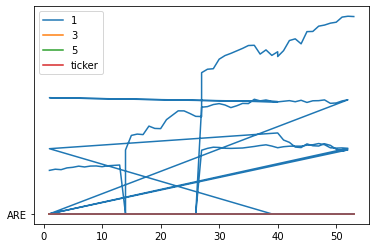

...

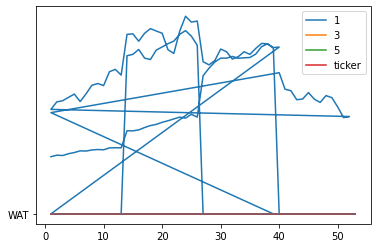

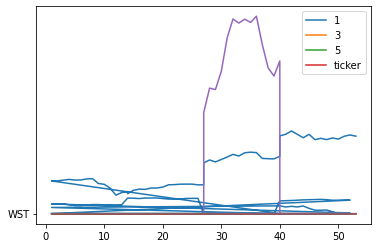

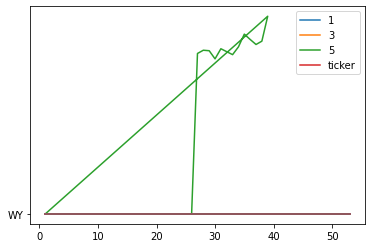

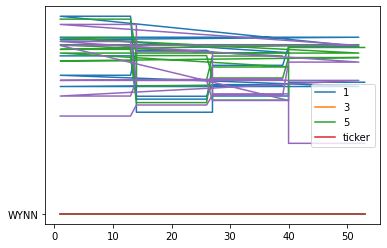

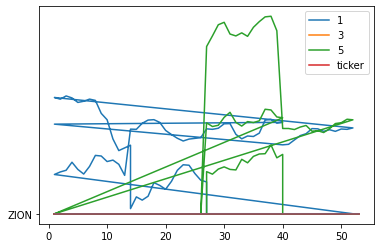

In [18]:
for ticker in product["ticker"].unique():
    for training_years in training_range:
        data = product[(product["ticker"]==ticker) & (product["training_years"]==training_years)]
        
        plt.plot(data["week"],data["weekly_price_regression_prediction"])
        plt.plot(data["week"],data["ticker"])
        leg = [1,3,5]
        leg.append("ticker")
        plt.legend(leg)
    plt.show()

In [20]:
from sklearn.metrics import mean_squared_error
analysis = []
for ticker in product.ticker.unique():
    for training_years in training_range:
        try:
            data = product[(product["ticker"]==ticker) & (product["training_years"]==training_years)]
            mse = mean_squared_error(data["weekly_price_regression_prediction"],data[ticker])
            analysis.append({"ticker":ticker,"training_years":training_years,"mse":mse
                             ,"confidence":data["weekly_price_regression_score"].mean()
                            ,"max_p":data["weekly_price_regression_prediction"].max()
                            ,"max_a":data[ticker].max()})
        except:
            continue

In [21]:
pd.DataFrame(analysis)

,ticker,training_years,mse,confidence,max_p,max_a
0,MMM,3,4.888111e+10,0.929805,5.271576e+05,225.699692
1,MMM,5,7.137921e+09,0.965888,3.656632e+05,225.699692
2,MMM,7,3.398486e+03,0.981718,1.430803e+02,225.699692
3,ACN,3,2.457400e+11,0.949413,1.193830e+06,258.165298
4,ACN,5,6.774539e+09,0.966661,4.187982e+05,258.165298
...,...,...,...,...,...,...
1306,WYNN,5,1.273320e+03,0.900961,1.349928e+02,185.156766
1307,WYNN,7,1.628951e+03,0.894204,1.313312e+02,185.156766
1308,ZION,3,1.575418e+08,0.892680,3.154737e+04,53.275320
1309,ZION,5,2.268994e+08,0.913903,5.286139e+04,53.275320


In [22]:
product

,year,quarter_x,week,weekly_price_classification_prediction,weekly_price_classification_score,weekly_price_regression_prediction,weekly_price_regression_score,ticker,training_years,_id,...,WYNN,XEL,XLNX,XOM,XRAY,XRX,YUM,ZBH,ZBRA,ZION
0,2017,1,1.0,1.0,0.571429,269359.468750,0.933841,MMM,3,6062064462e2ffc6bbacb716,...,83.758966,36.013211,54.700220,71.904615,56.734162,24.357770,59.083437,100.957663,85.997499,39.195560
1,2017,1,2.0,1.0,0.571429,270841.781250,0.933841,MMM,3,6062064462e2ffc6bbacb717,...,85.791263,35.811006,54.563642,69.522591,55.995266,24.203859,60.176212,109.304706,84.810001,39.267883
2,2017,1,3.0,1.0,0.571429,273612.125000,0.933841,MMM,3,6062064462e2ffc6bbacb718,...,84.792023,36.311227,54.045286,69.177763,54.811874,24.063782,59.921411,111.023932,83.542501,38.196690
3,2017,1,4.0,1.0,0.571429,285368.031250,0.933841,MMM,3,6062064462e2ffc6bbacb719,...,89.254561,36.026459,54.502109,68.564481,54.594953,24.051678,60.874973,111.610547,84.696001,38.823132
4,2017,1,5.0,1.0,0.571429,284494.125000,0.933841,MMM,3,6062064462e2ffc6bbacb71a,...,91.935892,36.294891,54.269035,67.305751,54.928082,24.397546,61.143418,113.742284,83.403999,38.325954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293354,2020,4,49.0,1.0,0.536842,36.766022,0.968412,ZION,7,6062064462e2ffc6bbacb7e8,...,105.995999,66.561627,146.152002,39.029198,51.965090,22.309863,104.996754,147.223947,373.728003,41.066010
293355,2020,4,50.0,1.0,0.536842,36.766022,0.968412,ZION,7,6062064462e2ffc6bbacb7e9,...,111.530000,64.763036,144.710001,42.036132,53.692876,22.614502,105.376930,144.949091,375.847998,42.299780
293356,2020,4,51.0,0.0,0.536842,36.766022,0.968412,ZION,7,6062064462e2ffc6bbacb7ea,...,113.522000,65.033220,150.788000,42.315389,52.825995,22.851884,107.259908,148.027423,378.550000,41.153429
293357,2020,4,52.0,1.0,0.536842,36.766022,0.968412,ZION,7,6062064462e2ffc6bbacb7eb,...,113.710001,64.203603,143.355003,40.944669,51.783748,22.284147,107.076786,149.007553,378.125000,42.546136
